# Topyfic on microglia cell in mouse models of familial AD from Model-AD
### *Narges Rezaie*
#### Vignette built on Jan 20, 2023 with Topyfic version 0.1.3.

The aim of this tutorials is to introduce the basic concepts behind an analysis of single-cell RNA-seq data using a Latent Dirichlet allocation (LDA), and to show how to use Topyfic to implement it and analyse the results. We introduce the basic concepts and Topyfic interface through a simple example using Microglial cells from [this paper](https://www.biorxiv.org/content/10.1101/2021.09.29.462436v1.abstract) and get the data from Model-AD data portal using [this card](https://www.synapse.org/#!Synapse:syn25812567). 
Here, we have a processed data as a count matrix along with their gene and samples information.

## Input data

In this tutorial, we will run Topyfic in 23,666 cells from [this paper](https://www.biorxiv.org/content/10.1101/2021.09.29.462436v1.abstract). We pooled out the data [from here](https://www.synapse.org/#!Synapse:syn25812567) and process them to make seurat object. Then save their raw count matrix along with metadate and gene informations then using [this normalzation](https://www.biorxiv.org/content/10.1101/2022.05.06.490859v1.full).

We begin our analysis by loading the libraries.

In [1]:
import Topyfic
import pandas as pd
import scanpy as sc
import numpy as np
import scipy as sp
import random

## preprocessing

You can use raw or normalizaed count matrix. However, we recommend you to do normalization specially if your data is cooming from multiple technologies.

In this tutorial, We used depth normalization from [this paper](https://www.biorxiv.org/content/10.1101/2022.05.06.490859v1.full)

### Depth normalization
normalized count data based on PFlog1pPF normalization methode

In [4]:
def normalization(mtx):
    pf = mtx.sum(axis=1).A.ravel()
    log1p_pf = np.log1p(sp.sparse.diags(pf.mean()/pf) @ mtx)
    
    pf = log1p_pf.sum(axis=1).A.ravel()
    pf_log1p_pf = sp.sparse.diags(pf.mean()/pf) @ log1p_pf
    
    return pf_log1p_pf

### read data

Topyfic can be initialized from precomputed matrix with cells as row, genes as columns and reads counts as value embeded in AnnData format along with cell information stored in obs and gene information in var. you can also use the output of scanpy/seurat object which saved as h5ad file.


In [ ]:
tissue = "model-AD"
data = sc.read_mtx(f"data/counts_scModelAD_all_genes.mtx")
genes = pd.read_csv(f"data/genes_scModelAD_all_genes.tsv", sep='\t')
barcodes = pd.read_csv(f"data/barcode_scModelAD_all_genes.tsv", sep='\t')

data.obs = genes
data.var = barcodes
data = data.transpose()

data.X = normalization(data.X)
data.X = np.round_(data.X)

data.var.index = data.var.x.values

data.write("data/scModelAD_all_genes.h5ad")

## make Train model
The next step is making our train model and learning LDA model serveral times(default is 100 time).

The main parameters for making Train object are:

* number of topics(k): number of topics to learn one LDA model using sklearn package (default: 50)

* number of tuns(n_runs): number of runs to define rLDA model (default: 100)

* list of seed for train LDA models (random_state_range): list of random state, we used to run LDA models (default: range(n_runs))

**Note**: To fit a LDA, we must specify K, the number of topics. Here, we have chosen K=15 topics. In most settings, a good choice of K will not be known in advance, so you will you want to explore the results from topic models at different settings of K.

In [3]:
train = Topyfic.Train(name="model-AD",
                      k=15,
                      n_runs=100)

## run LDA models
Now we have our Train object, we need to build our single LDA models.

The main parameters for runing LDA models are:

* data: expression data embedded in anndata format
* n_jobs: The number of jobs to use in the E-step. See [Glossary](https://scikit-learn.org/stable/glossary.html#term-n_jobs) for more details.
* n_thread: number of threads you used to learn LDA models.

**Note**: base on your data and your system this step may take a while.

In [ ]:
train.run_LDA_models(data, n_jobs=5, n_thread=5)

## Saving and loading your Train object

you can save or load your Train object with `save_train()` or `read_train()` function.

In [ ]:
train.save_train()

In [3]:
train = Topyfic.read_train("train_model-AD.p")

Reading Train done!


## Make TopModel object

Here, we used leiden clustring to found our reproducible topics and make TopModel object.

The main parameters for making TopModel object are:

* trains: list of train objects
* data: gene-count data with cells and genes information
* n_top_genes: Number of highly-variable genes to keep (default: 50)
* resolution: A parameter value controlling the coarseness of the clustering. Higher values lead to more clusters. (default: 1)
* min_cell_participation: minimum cell participation across for each topics to keep them, when is None, it will keep topics with cell participation more than number of cell / 10000.


         Falling back to preprocessing with `sc.pp.pca` and default params.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


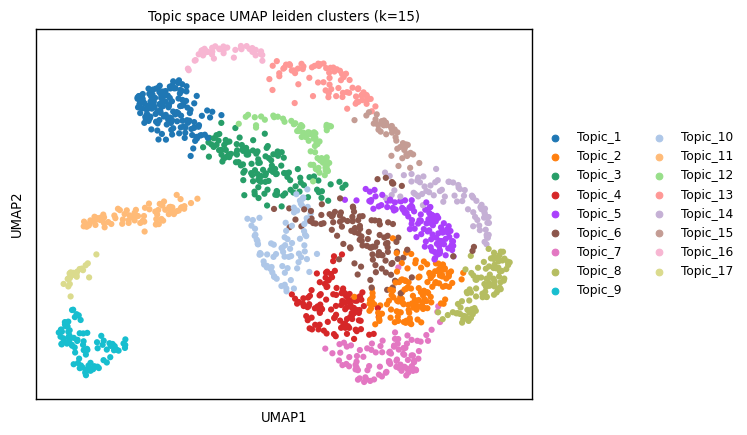

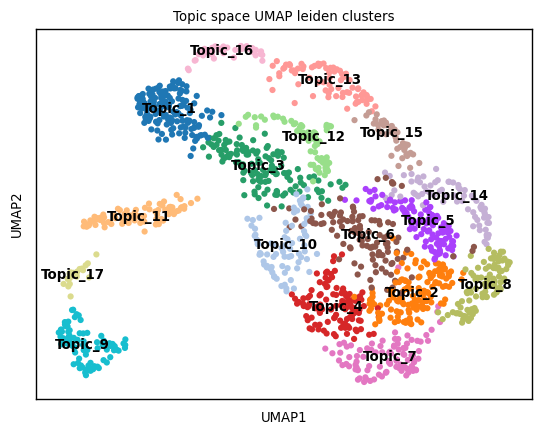

17 topics out of 17 topics have participation more than 2.3666


In [6]:
top_model, clustering = Topyfic.calculate_leiden_clustering(trains=[train], data=data)

## Saving and loading your TopModel object

you can save or load your TopModel object with `save_topModel()` or `read_topModel()` function.

In [7]:
top_model.save_topModel()

Saving topModel as topModel_model-AD.p


In [23]:
top_model = Topyfic.read_topModel("topModel_model-AD.p")

Reading TopModel done!


## Making analysis object

Now you have your topModel object which include our rLDA model. For doing downstream analysis, you have to make analysis object which include calculating cell participation for each topics.

you can also define color for each topic or the package will pick randomly.

In [ ]:
analysis_top_model = Topyfic.Analysis(Top_model=top_model)

## Cell participation: each cell is represented as a unique mixture of topics
A key feature of the topic model is that each cell i is represented as a unique mixture of the topics. Therefore, each cell can be summarized from the N mixture proportions.

In [ ]:
analysis_top_model.calculate_cell_participation(data=data)

## Saving and loading your analysis object

you can save or load your TopModel object with `save_analysis()` or `read_analysis()` function.

In [ ]:
analysis_top_model.save_analysis()

In [2]:
analysis_top_model = Topyfic.read_analysis("analysis_model-AD.p")

Reading TopModel done!


## Interpreting topics using available cell annotations

In some cases, you may have additional information about the cells, such as the timepoint, sex, tissue or cell types the cells were sampled from. In this data, we have deveral cell types/sub types and time points along with thier seurat object (For more information look at [this paper](https://www.biorxiv.org/content/10.1101/2021.09.29.462436v1.abstract).

There is several ways to visualize the relationship between the cell labels and the mixture proportions.

### Create a Topic_Trait relationship heatmap
which shows the pearson correlation coefficient (color) and p-value (number in paranteces) for testing non-correlation between each topics and data traits.

For this

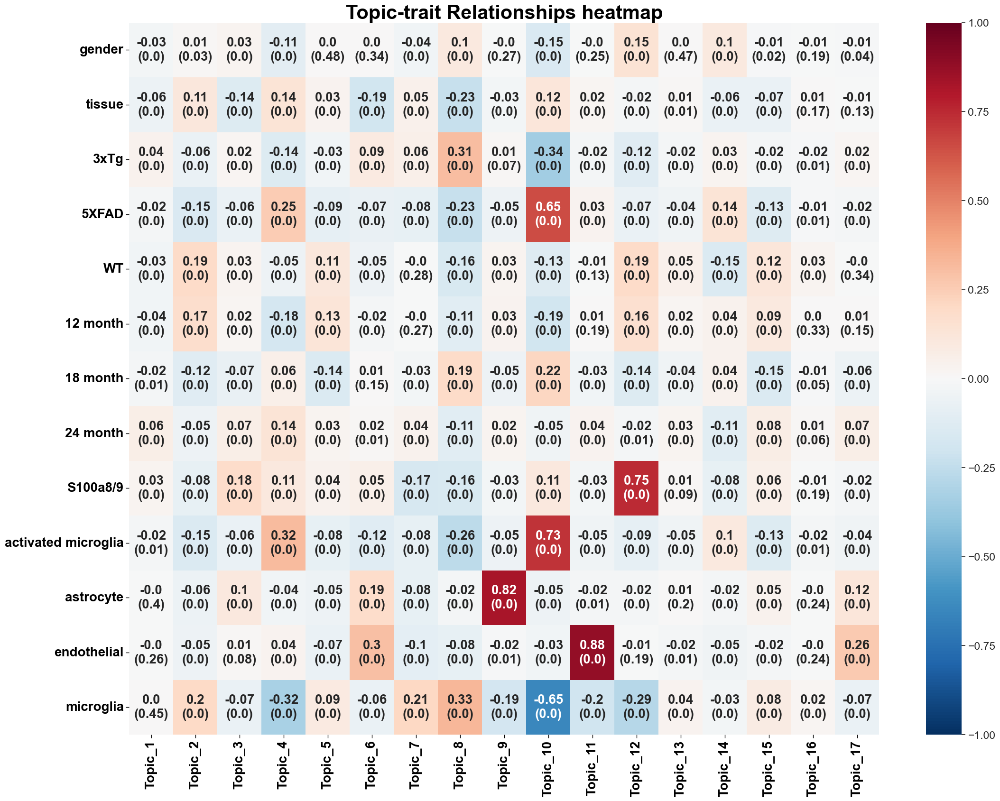

In [11]:
metadata = ['gender', 'tissue', 'genotype', 'age', 'cellType']
analysis_top_model.TopicTraitRelationshipHeatmap(metaData=metadata,
                                                 save=True,
                                                 show=True,
                                                 file_name='figures/topic-traitRelationships')

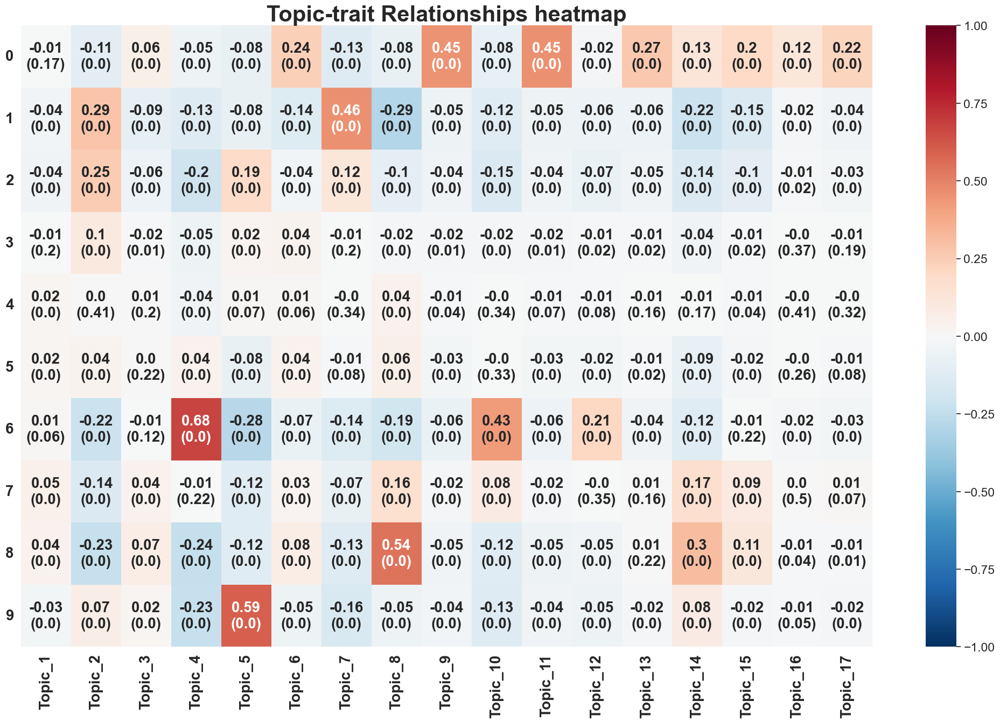

In [13]:
metadata = ['State']
analysis_top_model.TopicTraitRelationshipHeatmap(metaData=metadata,
                                                 save=True,
                                                 show=True,
                                                 file_name='figures/topic-traitRelationships_State')

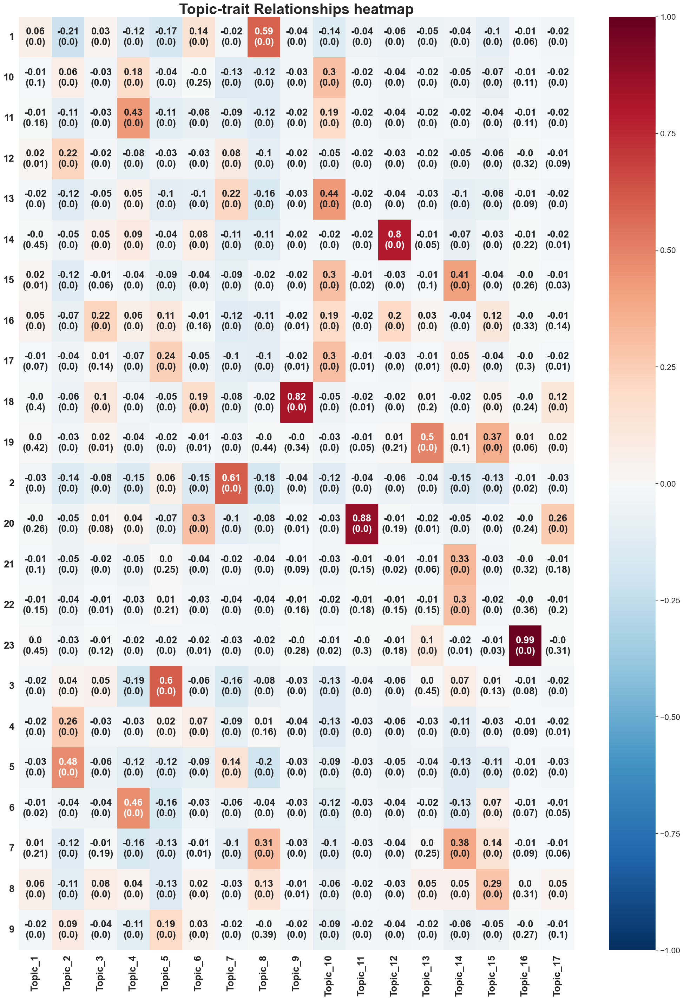

In [12]:
metadata = ['seurat_clusters']
analysis_top_model.TopicTraitRelationshipHeatmap(metaData=metadata,
                                                 save=True,
                                                 show=True,
                                                 file_name='figures/topic-traitRelationships_seurat_clusters')

### Average cell participation
you can plot the avarage of cell participation for each topics.

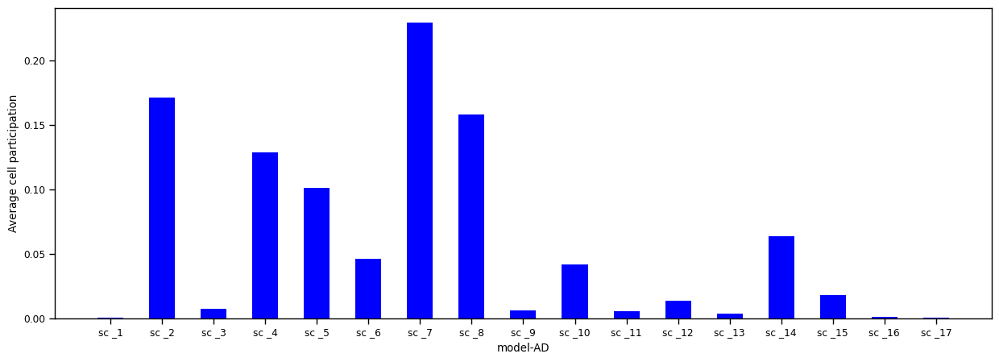

In [7]:
label = dict()
for i in range(analysis_top_model.top_model.N):
    key = f"Topic_{i+1}"
    value = f"sc _{i+1}"
    label[key] = value

analysis_top_model.average_cell_participation(label=label,
                                              figsize=(15,5),
                                              file_name="figures/average_cell_participation")

### Creat pie chart

The pie charts show the contrubution of each topics to each data traits.

For example here, we plot pie charts for each subtypes of data we have.

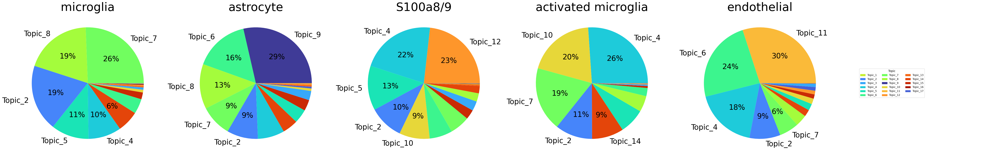

In [8]:
cellType = ['microglia', 'astrocyte', 'S100a8/9', 'activated microglia', 'endothelial']
file_name = f"figures/pieChart/dist_topics_subtypes_RNA"
analysis_top_model.pie_structure_Chart(level='cellType',
                                       category=cellType,
                                       save=True,
                                       show=True,
                                       file_name=file_name)

###  Create sctructure plots

The Structure plot is a simply stacked bar chart, in which each topic is represented as a bar of a different color. 
Being proportions, the mixture proportions for each cell must sum to 1, so the total height of the bars is the same for all cells, which makes it easier to compare across cells. 
Patterns begin to emerge when the cells are arranged so that cells with similar mixture proportions are positioned close to each other using hierarchy clustering (**hierarchy**). There is also other opthion to sort your cells like **sum** (sort cells by sum of top n topics) or just sort by **metaData**.

you should also pass color palette for data trait you want to add in your structure plot.
In our data sets we want to add time point of the cell and their clusters.

In [13]:
my_palette_timepoint = {'12 month': 'thistle',
                        '18 month': 'plum',
                        '24 month': 'violet'}
my_palette_genotype = {'3xTg': 'red',
                        '5XFAD': 'blue',
                        'WT': 'green'}
my_palette_sex = {'Male': 'yellow',
                  'Female': 'orange'}
my_palette_cluster = {}
for name in np.unique(data.obs['seurat_clusters']):
    my_palette_cluster[name] = "#"+''.join([random.choice('ABCDEF0123456789') for i in 
range(6)])
    
my_palette_state = {}
for name in np.unique(data.obs['State']):
    my_palette_state[name] = "#"+''.join([random.choice('ABCDEF0123456789') for i in 
range(6)])
    
my_palette = {'age' : my_palette_timepoint,
              'gender': my_palette_sex,
              'genotype': my_palette_genotype,
              'State': my_palette_state,
              'seurat_clusters': my_palette_cluster}

You can sort your cells by seurat clusters or state from pseudotime analysis which they discuss in the paper.

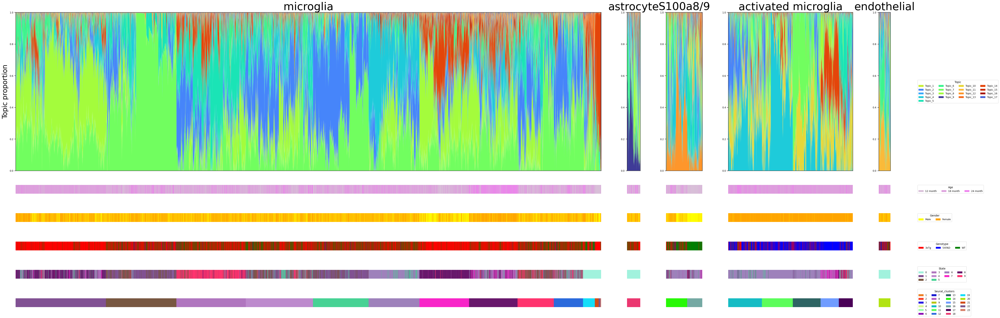

In [20]:
cellType = ['microglia', 'astrocyte', 'S100a8/9', 'activated microglia', 'endothelial']
file_name = f"figures/structurePlot/dist_topics_cellType_RNA_cluster_hierarchical_seurat_clusters"
analysis_top_model.structure_plot(level='cellType',
                                  category=cellType, 
                                  metaData=["age", "gender", "genotype", "State", "seurat_clusters"],
                                  metaData_palette=my_palette,
                                  order_cells=["seurat_clusters", 'hierarchy'],
                                  save=True,
                                  show=True,
                                  figsize=(60,20),
                                  file_name=file_name)

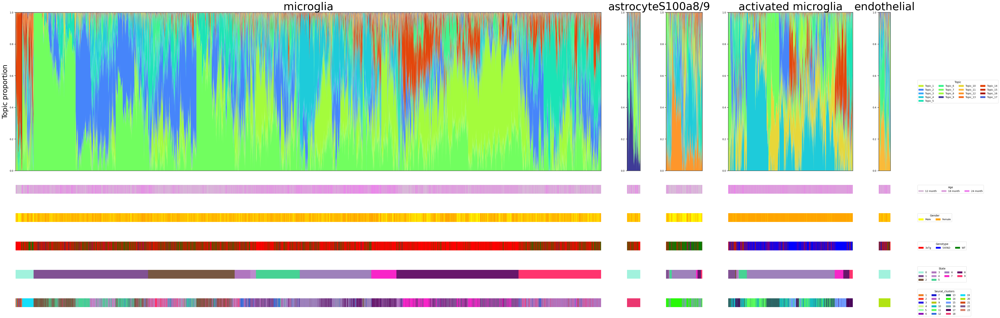

In [21]:
cellType = ['microglia', 'astrocyte', 'S100a8/9', 'activated microglia', 'endothelial']
file_name = f"figures/structurePlot/dist_topics_cellType_RNA_cluster_hierarchical_State"
analysis_top_model.structure_plot(level='cellType',
                                  category=cellType, 
                                  metaData=["age", "gender", "genotype", "State", "seurat_clusters"],
                                  metaData_palette=my_palette,
                                  order_cells=["State", 'hierarchy'],
                                  save=True,
                                  show=True,
                                  figsize=(60,20),
                                  file_name=file_name)

### gene topic weights

one of the way to analyse the topics is looking at the weights of each genes in each topics. you can access to this information using `get_gene_weights()` function.

In [24]:
gene_weights = top_model.get_gene_weights()
gene_weights

,model-AD_Topic_1,model-AD_Topic_2,model-AD_Topic_3,model-AD_Topic_4,model-AD_Topic_5,model-AD_Topic_6,model-AD_Topic_7,model-AD_Topic_8,model-AD_Topic_9,model-AD_Topic_10,model-AD_Topic_11,model-AD_Topic_12,model-AD_Topic_13,model-AD_Topic_14,model-AD_Topic_15,model-AD_Topic_16,model-AD_Topic_17
0,1.247925,391.480192,11.201037,168.331473,219.570456,76.487946,0.058824,152.726337,0.058824,103.276438,0.058824,42.238461,0.058824,0.058824,0.058824,0.058824,0.058824
1,1.979521,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,101.326791,0.058824,119.925038,7.070489,0.058824
2,0.058824,0.058824,0.058824,0.058824,0.058824,39.971294,0.058824,144.251646,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824
3,1.471373,1730.460364,27.935439,380.711357,1032.249954,300.259172,3257.200892,1716.616765,0.058824,173.558472,48.171089,179.799743,0.058824,617.264457,45.438132,0.058824,22.673101
4,1.221685,151.368128,14.974814,0.058824,223.333814,36.793776,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14684,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824
14685,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824
14686,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824
14687,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824


### gene rank with their weights in each topic

if you want to look at the genes in each topics sorted by their weights you can use`get_ranked_gene_weight()` function.

In [25]:
gene_rank_weights = top_model.get_ranked_gene_weight()
gene_rank_weights

,model-AD_Topic_1,model-AD_Topic_2,model-AD_Topic_3,model-AD_Topic_4,model-AD_Topic_5,model-AD_Topic_6,model-AD_Topic_7,model-AD_Topic_8,model-AD_Topic_9,model-AD_Topic_10,model-AD_Topic_11,model-AD_Topic_12,model-AD_Topic_13,model-AD_Topic_14,model-AD_Topic_15,model-AD_Topic_16,model-AD_Topic_17
0,4356;232.84266081369174,3549;8139.705868797461,9806;429.091988659053,3549;14115.714331965773,2657;4305.922111222279,3549;2561.6749361240427,3549;27868.065340044177,3549;18181.68489626177,470;1000.4556903418943,281;11386.085563042436,2366;967.8802624792171,10844;1407.0591405283685,404;5693.215696118107,4284;10329.375922747893,404;8343.861501760734,4356;406.4861239379635,4181;1296.1017313053237
1,281;177.8606097071822,2657;6420.434299725135,3549;403.3902928147277,281;11327.93567768291,3549;4006.756462099625,9806;1992.2854453893567,6353;16831.770615841466,4284;15123.270255541733,281;856.300671133289,2666;5814.888615325625,4309;827.6212831142441,4284;1350.26110080699,7304;3636.620493425645,3549;9367.135119039523,795;5339.446739071996,7891;246.44555093618564,470;855.3548805837149
2,11526;159.63834995852244,1112;4583.521422211895,4284;364.52581730839887,2666;10843.393159866098,8012;3526.184256174106,4284;1952.923889298533,4284;16286.570237604947,9806;12905.713058170712,4181;846.159741624577,8903;5155.0429858933185,9240;631.555076861122,9806;1185.5904455682191,9648;3088.8262159419983,7284;9023.079288412793,7304;5257.46737337078,1248;225.5301282655054,2366;829.1257320464055
3,10844;97.47827323939038,5943;4488.425617208254,7284;304.76638856117455,6128;10683.091981321502,2088;3436.4896825853784,6353;1669.10011717905,5943;14908.896021914727,6353;12002.321526050819,1008;739.2136524657996,1958;5094.100636209816,1385;586.0269522751787,1298;1083.0022650247986,4522;3037.028328379794,9806;7407.974201949983,9648;4141.3115064735675,9490;186.86833677349574,9806;806.6590789803454
4,11678;95.72587993308808,7577;4325.129608481892,6353;292.4138743231258,9806;10466.023498898621,6149;3374.3348267708548,7284;1555.1618849940721,7712;14626.464103019356,7284;11701.637945312892,3886;682.0190982122663,8960;4769.677717889132,2487;573.9456391324461,7712;1044.8381342362218,795;2996.3596606591755,9706;6767.096956350125,4522;3922.072276079982,7212;183.80046506415744,281;738.2895799802819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14684,8389;0.058823529411764705,6220;0.058823529411764705,8033;0.058823529411764705,5801;0.058823529411764705,5692;0.058823529411764705,7061;0.058823529411764705,5274;0.058823529411764705,5969;0.058823529411764705,5227;0.058823529411764705,5580;0.058823529411764705,5290;0.058823529411764705,5353;0.058823529411764705,5113;0.058823529411764705,5597;0.058823529411764705,5387;0.058823529411764705,5091;0.058823529411764705,5257;0.058823529411764705
14685,8387;0.058823529411764705,6221;0.058823529411764705,8032;0.058823529411764705,5802;0.058823529411764705,5694;0.058823529411764705,7064;0.058823529411764705,5275;0.058823529411764705,5970;0.058823529411764705,5229;0.058823529411764705,5581;0.058823529411764705,5291;0.058823529411764705,5354;0.058823529411764705,5114;0.058823529411764705,5598;0.058823529411764705,5388;0.058823529411764705,5092;0.058823529411764705,5258;0.058823529411764705
14686,8386;0.058823529411764705,6222;0.058823529411764705,8031;0.058823529411764705,5803;0.058823529411764705,5695;0.058823529411764705,7065;0.058823529411764705,5276;0.058823529411764705,5971;0.058823529411764705,5230;0.058823529411764705,5582;0.058823529411764705,5292;0.058823529411764705,5355;0.058823529411764705,5115;0.058823529411764705,5599;0.058823529411764705,5389;0.058823529411764705,5093;0.058823529411764705,5259;0.058823529411764705
14687,8385;0.058823529411764705,6223;0.058823529411764705,8030;0.058823529411764705,5805;0.058823529411764705,5696;0.058823529411764705,7067;0.058823529411764705,5277;0.058823529411764705,5973;0.058823529411764705,5231;0.058823529411764705,5583;0.058823529411764705,5293;0.058823529411764705,5356;0

### plot gene weights

plot gene weights of your list of genes with their ranks

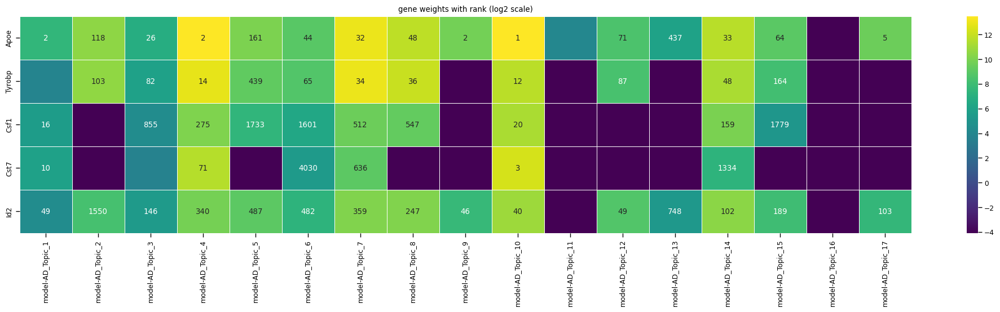

In [41]:
top_model.gene_weight_rank_heatmap(genes=["Apoe",
                                          "Tyrobp",
                                          "Csf1",
                                          "Cst7", 
                                          "Id2"],
                                   scale="log2",
                                   file_name="figures/gene_weight_rank_heatmap")

### Create Line plot
plot the avarage cell participation for each topics using two information of data traits (one as a x axis and the other one for different lines.

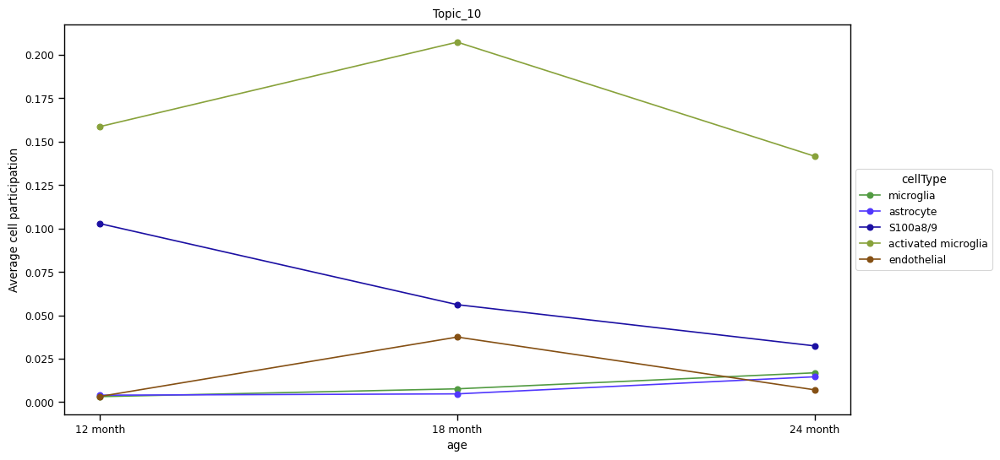

In [46]:
my_palette_subtypes = {}
for name in np.unique(data.obs['cellType']):
    my_palette_subtypes[name] = "#"+''.join([random.choice('ABCDEF0123456789') for i in 
range(6)])

analysis_top_model.average_cell_participation_line_plot(topic=f"Topic_10",
                                                        color='cellType',
                                                        color_pallet=my_palette_subtypes,
                                                        category="age",
                                                        figsize=(12,6),
                                                        save=True,
                                                        show=True,
                                                        file_name=f"figures/linePlot/cellType_timepoint_Topic_10")

## Gene Set Enrichment Analysis (GSEA) analysis

perform GSEA analysis on each topic, to help us understand topics better.

For each topic, there is two different outputs that the `GSEA()` provide:
1. CSV file
`{Term: gene set name, 
  ES: enrichment score, 
  NES: normalized enrichment score, 
  NOM p-val:  Nominal p-value (from the null distribution of the gene set, 
  FDR q-val: FDR qvalue (adjusted False Discory Rate), 
  FWER p-val: Family wise error rate p-values, 
  Tag %: Percent of gene set before running enrichment peak (ES), 
  Gene %: Percent of gene list before running enrichment peak (ES), 
  Lead_genes: leading edge genes (gene hits before running enrichment peak)}`
  
2. pdf file for each GO terms that pass the threshold

**Note**: GSEA considers the gene ranks (gene weights in each topics) compares to gene ontology (GO)

In [5]:
GSEA_topic10 = top_model.topics['Topic_10'].GSEA(file_name=f"figures/GSEA/topic_{topic}",
                                                 verbose=True)
GSEA_topic10

2023-02-16 11:22:39,851 Parsing data files for GSEA.............................
2023-02-16 11:22:39,853 Enrichr library gene sets already downloaded in: /Users/nargesrezaie/.cache/gseapy, use local file
2023-02-16 11:22:39,976 5499 gene_sets have been filtered out when max_size=500 and min_size=15
2023-02-16 11:22:39,978 0537 gene_sets used for further statistical testing.....
2023-02-16 11:22:39,979 Start to run GSEA...Might take a while..................
2023-02-16 11:22:42,342 Congratulations. GSEApy runs successfully................



,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,regulation of blood vessel endothelial cell mi...,0.874269,1.792195,0.0,0.06422,0.045,3/15,2.58%,APOE;TMSB4X;TNF
55,"nuclear-transcribed mRNA catabolic process, no...",0.746814,1.601621,0.0,0.068401,0.818,47/70,19.30%,RPLP1;RPS5;RPS14;RPLP0;RPS9;RPS3;RPS15;RPL32;R...
57,protein targeting to ER (GO:0045047),0.745443,1.599248,0.0,0.068325,0.829,47/70,19.30%,RPLP1;RPS5;RPS14;RPLP0;RPS9;RPS3;RPS15;RPL32;R...
58,translation (GO:0006412),0.742869,1.598075,0.0,0.068306,0.834,50/79,19.30%,EEF1A1;RPLP1;RPS5;RPS14;RPLP0;RPS9;RPS3;RPS15;...
60,cytoplasmic translation (GO:0002181),0.743683,1.596193,0.0,0.067556,0.838,46/68,19.30%,RPLP1;RPS5;RPS14;RPLP0;RPS9;RPS3;RPS15;RPL32;R...
...,...,...,...,...,...,...,...,...,...
532,RNA processing (GO:0006396),0.174406,0.372786,0.997994,1.0,1.0,21/42,53.56%,APOBEC1;HNRNPA2B1;RBMS1;HNRNPK;SRSF5;MBNL1;SF3...
526,protein polyubiquitination (GO:0000209),0.2028,0.43379,0.999,1.0,1.0,11/57,27.73%,TNFAIP3;UBC;UBB;UBE2D3;PSMB6;PSME1;PSMB1;PSMB4...
535,"mRNA splicing, via spliceosome (GO:0000398)",0.131749,0.284322,1.0,1.0,1.0,7/59,21.69%,DDX5;PABPC1;YBX1;HNRNPA2B1;HNRNPK;HSPA8;SRSF5
534,"RNA splicing, via transesterification reaction...",0.138266,0.298145,1.0,1.0,1.0,7/57,21.69%,DDX5;PABPC1;YBX1;HNRNPA2B1;HNRNPK;HSPA8;SRSF5


## functional enrichment analysis

Analysing our topics by using the GO, KEGG, and REACTOME databases.

**Note:** We recommand using this function if your input dataset contains all genes and you didn't subset the dataset.

In [4]:
top_model.topics['Topic_10'].functional_enrichment_analysis(type="GO",
                                             organism="Mouse",
                                             sets=["GO_Biological_Process_2021"],
                                             p_value=0.05,
                                             file_name=f"figures/GO/topic_10")

you can see plot here: [GO terms for Topic 10](figures/GO/topic_10.pdf)

In [13]:
top_model.topics['Topic_10'].functional_enrichment_analysis(type="REACTOME",
                                                            organism="Mouse",
                                                            sets=["GO_Biological_Process_2021"],
                                                            p_value=0.05,
                                                            file_name=f"figures/REACTOME/topic_10")

Status code returned a value of 404
1488 out of 2052 identifiers in the sample were found in Reactome.
11223 pathways were hit by at least one of them, which 1 of them have p-value more than 0.05.
Report was saved figures/REACTOME/topic_10!
For more information please visit https://reactome.org/PathwayBrowser/#/DTAB=AN&ANALYSIS=MjAyMzAyMTYyMDU3MDNfMjMwNTA%3D


***if you need more infor about the inputs of each functions look at the API documentation [here](https://mortazavilab.github.io/Topyfic/html/api.html).***